In [1]:
import mdtraj as md
import numpy as np
import pickle
import os
from tqdm import tqdm_notebook
from simtk.openmm import app

In [4]:
htf = pickle.load(open(os.path.join(outdir, f"{i}_{phase}.pickle"), "rb"))

## Generate protein only PDB of cycle 29

In [3]:
outdir = "/data/chodera/zhangi/perses_benchmark/neq/15/64"
i = 64
phase = 'complex'
cycle = 29

Load forward neq traj (new pos)

In [5]:
with open(os.path.join(outdir, f"{i}_{phase}_{cycle}_forward_neq_new.npy"), 'rb') as f:
    neq_forward_new = np.load(f)

In [6]:
neq_forward_new.shape

(100, 16305, 3)

Since the new positions are protein + ions only, edit the topology to be match the positions

In [7]:
modeller = app.Modeller(htf._topology_proposal.new_topology, htf.new_positions(htf.hybrid_positions))
modeller.deleteWater()

In [8]:
new_top = md.Topology.from_openmm(modeller.topology)

Create a traj with the pos and top

In [9]:
traj = md.Trajectory(np.array(neq_forward_new), new_top)

Delete the ions in the traj

In [10]:
new_traj = traj.atom_slice(traj.top.select("not (resn 'Na+' or resn 'Cl-' or type H)"))

In [11]:
new_traj

<mdtraj.Trajectory with 100 frames, 8168 atoms, 975 residues, without unitcells at 0x2b88664be760>

Save the last snapshot of the neq traj

In [97]:
new_traj[-1].save("/data/chodera/zhangi/perses_benchmark/neq/15/74/29.pdb")

Delete the ions in the traj (keep hydrogens)

In [12]:
new_traj = traj.atom_slice(traj.top.select("not (resn 'Na+' or resn 'Cl-')"))

In [13]:
new_traj

<mdtraj.Trajectory with 100 frames, 15981 atoms, 975 residues, without unitcells at 0x2b8866d0d490>

Save the last snapshot of the neq traj

In [14]:
new_traj[-1].save("/data/chodera/zhangi/perses_benchmark/neq/15/74/29_withh.pdb")

## Generate protein only PDB of cycle 28

In [98]:
outdir = "/data/chodera/zhangi/perses_benchmark/neq/15/64"
i = 64
phase = 'complex'
cycle = 28

Load forward neq traj (new pos)

In [99]:
with open(os.path.join(outdir, f"{i}_{phase}_{cycle}_forward_neq_new.npy"), 'rb') as f:
    neq_forward_new = np.load(f)

In [100]:
neq_forward_new.shape

(100, 16305, 3)

Since the new positions are protein + ions only, edit the topology to be match the positions

In [101]:
modeller = app.Modeller(htf._topology_proposal.new_topology, htf.new_positions(htf.hybrid_positions))
modeller.deleteWater()

In [102]:
new_top = md.Topology.from_openmm(modeller.topology)

Create a traj with the pos and top

In [103]:
traj = md.Trajectory(np.array(neq_forward_new), new_top)

Delete the ions in the traj

In [104]:
new_traj = traj.atom_slice(traj.top.select("not (resn 'Na+' or resn 'Cl-' or type H)"))

In [105]:
new_traj

<mdtraj.Trajectory with 100 frames, 8168 atoms, 975 residues, without unitcells at 0x2b24f30dc940>

Save the last snapshot of the neq traj

In [106]:
new_traj[-1].save("/data/chodera/zhangi/perses_benchmark/neq/15/74/28.pdb")

# Run vanilla MD

In [110]:
from __future__ import division, print_function

import sys
from sys import stdout

import mdtraj as md
import simtk.openmm as mm
import simtk.openmm.app as app
import simtk.unit as unit
from mdtraj.reporters import DCDReporter
from simtk.openmm import XmlSerializer
from simtk.openmm import MonteCarloBarostat
from simtk.openmm.app import CheckpointReporter, PDBFile
from simtk.openmm.app.amberinpcrdfile import AmberInpcrdFile
from simtk.openmm.app.amberprmtopfile import AmberPrmtopFile
from simtk.openmm.app.pdbreporter import PDBReporter
from simtk.openmm.app.statedatareporter import StateDataReporter
import openmmtools
import time
from simtk.openmm import CustomBondForce
import argparse
import os



INFO:numexpr.utils:Note: detected 80 virtual cores but NumExpr set to maximum of 64, check "NUMEXPR_MAX_THREADS" environment variable.
INFO:numexpr.utils:Note: NumExpr detected 80 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.


In [135]:
# Read args
prefix = "/data/chodera/zhangi/perses_benchmark/neq/15/74/tleap/29"

# Set parameters
print("Reading parameters...")
pressure = 1.0 * unit.atmospheres
temperature = 310 * unit.kelvin
nonbonded_method = app.PME
constraints = app.HBonds
remove_cm_motion = False
hydrogen_mass = 4.0 * unit.amu  # Using HMR
collision_rate = 1.0 / unit.picoseconds
timestep = 0.004 * unit.picoseconds  # We can use a 4fs timestep with HMR

# Set steps and frequencies
nsteps = 5000000  # 20 ns
report_freq = 100
chk_freq = 500
traj_freq = 4000  # 1250 frames

# Set input file names
amber_prmtop_file = f"{prefix}_tleap.prmtop"
amber_inpcrd_file = f"{prefix}_tleap.inpcrd"

# Set file names
output_prefix = f'/data/chodera/zhangi/perses_benchmark/neq/15/74/equil/29/'
integrator_xml_filename = "integrator.xml"
state_xml_filename = "state.xml"
state_pdb_filename = "equilibrated.pdb"
system_xml_filename = "system.xml"
checkpoint_filename = "equilibrated.chk"
traj_output_filename = "equilibrated.dcd"
state_data_filename = "state_data.csv"
minimized_pdb_filename = "minimized.pdb"



Reading parameters...


In [136]:
# Load the AMBER files
print("Creating OpenMM system from AMBER input files...")
prmtop = AmberPrmtopFile(amber_prmtop_file)
inpcrd = AmberInpcrdFile(amber_inpcrd_file)



Creating OpenMM system from AMBER input files...


In [137]:
amber_prmtop_file

'/data/chodera/zhangi/perses_benchmark/neq/15/74/tleap/29_tleap.prmtop'

In [138]:
amber_inpcrd_file

'/data/chodera/zhangi/perses_benchmark/neq/15/74/tleap/29_tleap.inpcrd'

In [139]:
prmtop.topology

<Topology; 1 chains, 59796 residues, 191332 atoms, 191047 bonds>

In [140]:
len(inpcrd.getPositions())

191332

In [ ]:
system = prmtop.createSystem(
    nonbondedMethod=nonbonded_method,
    constraints=constraints,
    temperature=temperature,
    removeCMMotion=remove_cm_motion,
    hydrogenMass=hydrogen_mass,
)

# Add virtual bond between chain R of RBD (CA of VAL172 ) and ACE2 (CA of GLN518)
force = CustomBondForce('0')
force.addBond(2636,8184, [])
system.addForce(force)

# Add a barostat to the system
system.addForce(MonteCarloBarostat(pressure, temperature))

# Make and serialize integrator - Langevin dynamics
print("Serializing integrator to %s" % integrator_xml_filename)
integrator = openmmtools.integrators.LangevinIntegrator(
    temperature,
    collision_rate,  # Friction coefficient
    timestep, 
    constraint_tolerance=1e-5
)
with open(output_prefix + integrator_xml_filename, "w") as outfile:
    xml = mm.XmlSerializer.serialize(integrator)
    outfile.write(xml)

# Define the platform to use; CUDA, OpenCL, CPU, or Reference. Or do not specify
# the platform to use the default (fastest) platform
platform = mm.Platform.getPlatformByName("OpenCL")
prop = dict(OpenCLPrecision="mixed")  # Use mixed single/double precision

# Create the Simulation object
sim = app.Simulation(prmtop.topology, system, integrator, platform, prop)

# Set the particle positions
sim.context.setPositions(inpcrd.positions)

In [42]:
modeller = app.Modeller(htf._topology_proposal.new_topology, htf.new_positions(htf.hybrid_positions))


In [54]:
ion_chain = [chain for chain in modeller.topology.chains() if chain.id == 'Y']

In [55]:
ion_chain

[<Chain 5>]

In [45]:
modeller.deleteWater()


In [56]:
modeller.delete(ion_chain)

In [58]:
modeller.topology

<Topology; 5 chains, 975 residues, 15981 atoms, 16252 bonds>

# Analyze vanilla MD

In [2]:
import pandas as pd
import os
import matplotlib.pyplot as plt

Before fixing naked charge issue

In [8]:
outdir_28 = "/data/chodera/zhangi/perses_benchmark/neq/15/74/equil/28/"
outdir_29 = "/data/chodera/zhangi/perses_benchmark/neq/15/74/equil/29/"

In [9]:
df_28 = pd.read_csv(os.path.join(outdir_28, "state_data.csv"), sep='\t')
df_29 = pd.read_csv(os.path.join(outdir_29, "state_data.csv"), sep='\t')

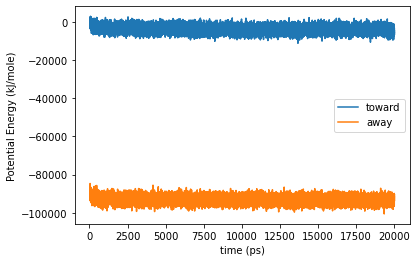

In [11]:
plt.plot(df_28['Time (ps)'][100:], df_28['Potential Energy (kJ/mole)'][100:] - df_28['Potential Energy (kJ/mole)'][100], label='toward')
plt.plot(df_29['Time (ps)'][100:], df_29['Potential Energy (kJ/mole)'][100:] - df_28['Potential Energy (kJ/mole)'][100], label='away')
plt.xlabel("time (ps)")
plt.ylabel("Potential Energy (kJ/mole)")
plt.legend()
plt.show()

After fixing naked charge issue

In [3]:
from simtk.openmm import XmlSerializer
from simtk.openmm import unit

In [4]:
outdir_28 = "/data/chodera/zhangi/perses_benchmark/neq/15/75/equil/28/"
outdir_29 = "/data/chodera/zhangi/perses_benchmark/neq/15/75/equil/29/"

In [5]:
df_28 = pd.read_csv(os.path.join(outdir_28, "state_data.csv"), sep='\t')
df_29 = pd.read_csv(os.path.join(outdir_29, "state_data.csv"), sep='\t')

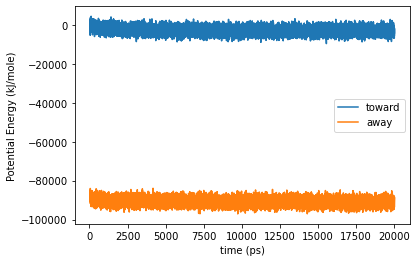

In [6]:
plt.plot(df_28['Time (ps)'][100:], df_28['Potential Energy (kJ/mole)'][100:] - df_28['Potential Energy (kJ/mole)'][100], label='toward')
plt.plot(df_29['Time (ps)'][100:], df_29['Potential Energy (kJ/mole)'][100:] - df_28['Potential Energy (kJ/mole)'][100], label='away')
plt.xlabel("time (ps)")
plt.ylabel("Potential Energy (kJ/mole)")
plt.legend()
plt.show()

Check that naked charges are removed

In [10]:
with open(os.path.join(outdir_28, 'system.xml'), 'r') as f:
    system = XmlSerializer.deserialize(f.read())


In [12]:
nb_force = system.getForce(3)

In [15]:
for i in range(nb_force.getNumParticles()):
    charge, sigma, epsilon = nb_force.getParticleParameters(i)
    if sigma == 0*unit.nanometer:
        print(f"{i} sigma 0!")
    if epsilon == 0*unit.kilojoule_per_mole:
        print(f"{i} epsilon 0!")

In [16]:
for i in range(nb_force.getNumParticles()):
    charge, sigma, epsilon = nb_force.getParticleParameters(i)
    print(charge, sigma, epsilon)

0.1123 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
-0.3662 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.1123 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.1123 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.5972000021951126 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.5679000016463344 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
-0.4157 e 0.3249998524031036 nm 0.7112799996555186 kJ/mol
0.27190000000000003 e 0.10690784617205229 nm 0.06568880001765333 kJ/mol
-0.038900000000000004 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.1007 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
0.3654 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0043 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
-0.2438 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.06420000000000001 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.06420000000000001 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.06420000000000001 e 0.264953278726022

0.06409999999999999 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
0.5896000010975563 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.5747999978048874 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
-0.5163 e 0.3249998524031036 nm 0.7112799996555186 kJ/mol
0.2936 e 0.10690784617205229 nm 0.06568880001765333 kJ/mol
0.038099999999999995 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.088 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
-0.030299999999999997 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
-0.0122 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
-0.0122 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.7993999989024436 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.8013999989024437 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
-0.8013999989024437 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
0.5366000000000001 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.5819000016463345 e 0.2959921901644687 nm 0.8786399993381852 kJ

-0.2438 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.06420000000000001 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.06420000000000001 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.06420000000000001 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
-0.6760999983536655 e 0.3066473387458142 nm 0.8803136010405576 kJ/mol
0.4102 e 0.08908987181403394 nm 0.01 kJ/mol
0.5973000005487781 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.5679000016463344 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
-0.4157 e 0.3249998524031036 nm 0.7112799996555186 kJ/mol
0.27190000000000003 e 0.10690784617205229 nm 0.06568880001765333 kJ/mol
-0.08750000000000001 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.09689999999999999 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
0.2985 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
-0.029699999999999997 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
-0.3192 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.

-0.41209999999999997 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.09999999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.09999999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.09999999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
-0.41209999999999997 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.09999999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.09999999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.09999999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.5973000005487781 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.5679000016463344 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
-0.4157 e 0.3249998524031036 nm 0.7112799996555186 kJ/mol
0.27190000000000003 e 0.10690784617205229 nm 0.06568880001765333 kJ/mol
-0.0031 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.08499999999999999 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
-0.0036 e 0.33996695

0.056 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
-0.0173 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
-0.0173 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.0136 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
-0.042499999999999996 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
-0.042499999999999996 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.8053999989024436 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.8187999978048873 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
-0.8187999978048873 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
0.5366000000000001 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.5819000016463345 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
-0.4157 e 0.3249998524031036 nm 0.7112799996555186 kJ/mol
0.27190000000000003 e 0.10690784617205229 nm 0.06568880001765333 kJ/mol
-0.0237 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.088 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
0.0342 e 0.33996

0.2985 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
-0.029699999999999997 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
-0.3192 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.07909999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.07909999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.07909999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
-0.3192 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.07909999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.07909999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.07909999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.5973000005487781 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.5679000016463344 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
-0.25479999999999997 e 0.3249998524031036 nm 0.7112799996555186 kJ/mol
0.0192 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.039099999999999996 e 0.24713530426421654 n

0.0171 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.0171 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
-0.0645 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0352 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.0352 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.6950999983536655 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.6086000010975563 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
-0.9406999994512218 e 0.3249998524031036 nm 0.7112799996555186 kJ/mol
0.4251 e 0.10690784617205229 nm 0.06568880001765333 kJ/mol
0.4251 e 0.10690784617205229 nm 0.06568880001765333 kJ/mol
0.5973000005487781 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.5679000016463344 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
-0.4157 e 0.3249998524031036 nm 0.7112799996555186 kJ/mol
0.27190000000000003 e 0.10690784617205229 nm 0.06568880001765333 kJ/mol
-0.0014 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0876 e 0.24713530426421654 nm 0.0656888004

-0.0237 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.088 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
0.0342 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0241 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.0241 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.0018 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.044 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
0.044 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
-0.2737 e 0.3563594872561357 nm 1.046 kJ/mol
-0.053599999999999995 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0684 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
0.0684 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
0.0684 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
0.5973000005487781 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.5679000016463344 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
-0.3479 e 0.3249998524031036 nm 0.7112799996555186 kJ/mol
0.2747 e 0.10690784617205229 nm 0.0656888

-0.11339999999999999 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
0.1417 e 0.2599642458735085 nm 0.06276000026869928 kJ/mol
-0.1972 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
0.1447 e 0.2599642458735085 nm 0.06276000026869928 kJ/mol
-0.23870000000000002 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
0.16999999999999998 e 0.2599642458735085 nm 0.06276000026869928 kJ/mol
0.1243 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
0.5973000005487781 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.5679000016463344 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
-0.4157 e 0.3249998524031036 nm 0.7112799996555186 kJ/mol
0.27190000000000003 e 0.10690784617205229 nm 0.06568880001765333 kJ/mol
-0.038900000000000004 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.1007 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
0.3654 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0043 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
-0.2438 e 0.3399669508450740

0.7340999983536656 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.5893999989024437 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
-0.4157 e 0.3249998524031036 nm 0.7112799996555186 kJ/mol
0.27190000000000003 e 0.10690784617205229 nm 0.06568880001765333 kJ/mol
-0.08750000000000001 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.09689999999999999 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
0.2985 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
-0.029699999999999997 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
-0.3192 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.07909999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.07909999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.07909999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
-0.3192 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.07909999999999999 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.07909999999999999 e 0.26495327872602226 nm

-0.6890000000000001 e 0.3066473387458142 nm 0.8803136010405576 kJ/mol
0.424 e 0.03563594872561358 nm 0.12552 kJ/mol
0.302 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
0.18 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
-0.6809999999999999 e 0.3066473387458142 nm 0.8803136010405576 kJ/mol
0.423 e 0.03563594872561358 nm 0.12552 kJ/mol
0.4799999999999999 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
-0.722 e 0.3249998524031036 nm 0.7112799996555186 kJ/mol
0.3 e 0.10690784617205229 nm 0.06568880001765333 kJ/mol
0.648 e 0.33996695079448314 nm 0.35982400053705343 kJ/mol
-0.576 e 0.2959921901644687 nm 0.8786399993381852 kJ/mol
0.033999999999999996 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.0 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.0 

-0.494 e 0.30000123432245224 nm 0.7112800004413506 kJ/mol
0.187 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
0.06499999999999999 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.0 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.0 e 0.26495327872602226 nm 0.06568880010977264 kJ/mol
0.26299999999999996 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
-0.739 e 0.3066473387458142 nm 0.8803136010405576 kJ/mol
0.447 e 0.03563594872561358 nm 0.12552 kJ/mol
0.22799999999999998 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
-0.693 e 0.3066473387458142 nm 0.8803136010405576 kJ/mol
0.426 e 0.03563594872561358 nm 0.12552 kJ/mol
0.45599999999999996 e 0.33996695084507406 nm 0.45772959964740484 kJ/mol
0.0 e 0.24713530426421654 nm 0.0656888004119626 kJ/mol
-0

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
-0.834 e 0.315075240713007 nm 0.6359679988330078 kJ/mol
0.417 e 0.08908987181403394 nm 0.01 kJ/mol
0.417 

In [19]:
with open("/data/chodera/zhangi/perses_benchmark/repex/31/28/0/28_apo.pickle", "rb") as f:
    htf = pickle.load(f)

In [22]:
nb_force = htf._topology_proposal.old_system.getForce(3)

In [23]:
for i in range(nb_force.getNumParticles()):
    charge, sigma, epsilon = nb_force.getParticleParameters(i)
    if sigma == 0*unit.nanometer:
        print(f"{i} sigma 0!")
    if epsilon == 0*unit.kilojoule_per_mole:
        print(f"{i} epsilon 0!")

# Count water atoms

In [21]:
import mdtraj as md

In [25]:
top_28 = md.load(os.path.join(outdir_28, "equilibrated.pdb"))
traj_28 = md.load(os.path.join(outdir_28, "equilibrated.dcd"), top=top_28)

In [26]:
top_29 = md.load(os.path.join(outdir_29, "equilibrated.pdb"))
traj_29 = md.load(os.path.join(outdir_29, "equilibrated.dcd"), top=top_29)

In [40]:
for res in top_28.topology.residues:
    if res.resSeq == 170 and res.chain.index == 0 and res.name == 'TYR':
        mutated_res = res
query_indices = [atom.index for atom in mutated_res.atoms]

In [41]:
water_atoms = list(traj_28.topology.select(f"water"))



In [45]:
neighbors = md.compute_neighbors(traj_28, 0.5, query_indices, haystack_indices=water_atoms)


<ipython-input-45-6f7ca7577157>:1: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  neighbors = md.compute_neighbors(traj_28, 0.5, query_indices, haystack_indices=water_atoms)


In [63]:
neighbors_count = [len(nbr_list) for nbr_list in neighbors]

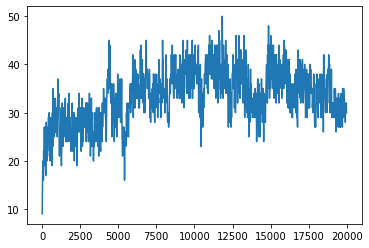

In [64]:
plt.plot(df_28['Time (ps)'][::40], neighbors_count)

In [66]:
for res in top_29.topology.residues:
    if res.resSeq == 170 and res.chain.index == 0 and res.name == 'TYR':
        mutated_res = res
query_indices = [atom.index for atom in mutated_res.atoms]

In [67]:
water_atoms = list(traj_29.topology.select(f"water"))
neighbors = md.compute_neighbors(traj_29, 0.5, query_indices, haystack_indices=water_atoms)
neighbors_count = [len(nbr_list) for nbr_list in neighbors]

<ipython-input-67-2a58d953db37>:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  neighbors = md.compute_neighbors(traj_29, 0.5, query_indices, haystack_indices=water_atoms)


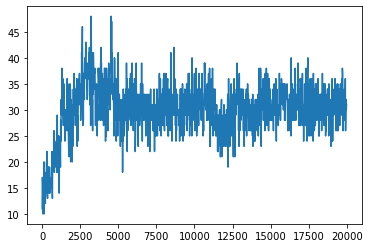

In [68]:
plt.plot(df_29['Time (ps)'][::40], neighbors_count)

In [72]:
-2.52e6 - -2.6e6

80000.0